In [ ]:
def save_obj(obj, name ):
    with open('obj/'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name ):
    with open('obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [11]:
import warnings
warnings.filterwarnings('ignore')

In [12]:
import numpy as np

In [13]:
from yasa import spindles_detect
from yasa import sw_detect
sf = 100
import matplotlib.pyplot as plt
fpzcz_index = np.r_[0]
pzoz_index = np.r_[1]
import pickle

In [14]:
from models import get_model_cnn_crf, get_model_cnn_crf_psg, get_model_lstm

In [15]:

import numpy as np
from utils import gen, chunker, WINDOW_SIZE, rescale_array
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import f1_score, accuracy_score, classification_report
from glob import glob
import os
from sklearn.model_selection import train_test_split
from tqdm import tqdm
# import matplotlib.pyplot as plt

import tensorflow as tf
# gpus = tf.config.experimental.list_physical_devices("GPU")
# tf.config.experimental.set_memory_growth(gpus[0], True)

tf.compat.v1.disable_eager_execution()

In [ ]:



base_path = '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/'
# print("BASE PATH", base_path)

files = sorted(glob(os.path.join(base_path, "*.npz")))

id = ['SC409', 'SC419', 'SC428', 'SC440', 'SC449',  'SC459',  'SC471',  'SC482']
list_f1 = []
list_acc = []
preds = []
gt = []

test_ids = set(id)
train_ids = set([x.split("/")[-1][:5] for x in files]) - test_ids

# print(train_ids)
# print(test_ids)

train_val, test = [x for x in files if x.split("/")[-1][:5] in train_ids],\
                  [x for x in files if x.split("/")[-1][:5] in test_ids]

train, val = train_test_split(train_val, test_size=0.1, random_state=1337)
indices = np.r_[0:6]

cnt = 1
train_dict = {}
for k in train:
    cnt+=1
#     if k.split("/")[-1] in files_uploaded:
#         continue
        
    print(k)
    data = {}
    train_dict[k] = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    train_dict[k]["y"] = data["y"]
    # train_dict[k]["x"] = data["x"]
    all_data = np.transpose(np.transpose(data["x"])[indices][:][:])
    
    all_data2= []
    for i in range(all_data.shape[0]):    
        temp = np.transpose(np.transpose(all_data[i])[fpzcz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([all_data[i], spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)


        temp = np.transpose(np.transpose(all_data[i])[pzoz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([temp2, spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)
        all_data2.append(temp2)
#     train_dict[k]["x"]=
    np.savez_compressed('train/' + k.split("/")[-1][:8]+'.npy', np.array(all_data2))
#     save_obj(np.array(all_data2), 'train_dict'+k.split("/")[-1][:8])
# save_obj(train_dict, 'train_dict_final')

In [ ]:
val_dict = {}
for k in val:
    cnt+=1
#     if k.split("/")[-1] in files_uploaded:
#         continue
        
    print(k)
    data = {}
    val_dict[k] = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    val_dict[k]["y"] = data["y"]
    # val_dict[k]["x"] = data["x"]
    all_data = np.transpose(np.transpose(data["x"])[indices][:][:])
    
    all_data2= []
    for i in range(all_data.shape[0]):    
        temp = np.transpose(np.transpose(all_data[i])[fpzcz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([all_data[i], spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)


        temp = np.transpose(np.transpose(all_data[i])[pzoz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([temp2, spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)
        all_data2.append(temp2)
#     val_dict[k]["x"]=
    np.savez_compressed('val/' + k.split("/")[-1][:8]+'.npy', np.array(all_data2))

In [ ]:
test_dict = {}
for k in test:
    cnt+=1
#     if k.split("/")[-1] in files_uploaded:
#         continue
        
    print(k)
    data = {}
    test_dict[k] = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    test_dict[k]["y"] = data["y"]
    # test_dict[k]["x"] = data["x"]
    all_data = np.transpose(np.transpose(data["x"])[indices][:][:])
    
    all_data2= []
    for i in range(all_data.shape[0]):    
        temp = np.transpose(np.transpose(all_data[i])[fpzcz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([all_data[i], spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)


        temp = np.transpose(np.transpose(all_data[i])[pzoz_index][:][:])
        temp = temp.reshape(3000, )
        sp = spindles_detect(temp, sf)

        sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                       dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                       amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                       coupling=False, freq_sp=(12, 16))

        if sp is None:
            mask_spindles = np.zeros(len(temp))
        else:
            mask_spindles = sp.get_mask()

        spindles_highlight = temp * mask_spindles

        if sw is None:
            mask_sw = np.zeros(len(temp))
        else:
            mask_sw = sw.get_mask()

        sw_highlight = temp * mask_sw

        spindles_highlight = spindles_highlight.reshape(3000, 1)
        sw_highlight = sw_highlight.reshape(3000, 1)

        temp2 = np.concatenate([temp2, spindles_highlight], axis = 1)
        temp2 = np.concatenate([temp2, sw_highlight], axis = 1)
        all_data2.append(temp2)
#     test_dict[k]["x"]=
    np.savez_compressed('test/' + k.split("/")[-1][:8]+'.npy', np.array(all_data2))

In [1]:
from models import get_model_cnn_crf, get_model_cnn_crf_psg
import numpy as np
from utils import gen, chunker, WINDOW_SIZE, rescale_array
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import f1_score, accuracy_score, classification_report
from glob import glob
import os
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import tensorflow as tf
# gpus = tf.config.experimental.list_physical_devices("GPU")
# tf.config.experimental.set_memory_growth(gpus[0], True)

tf.compat.v1.disable_eager_execution()


base_path = '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/'

files = sorted(glob(os.path.join(base_path, "*.npz")))

id = ['SC409', 'SC419', 'SC428', 'SC440', 'SC449',  'SC459',  'SC471',  'SC482']
list_f1 = []
list_acc = []
preds = []
gt = []

test_ids = set(id)
train_ids = set([x.split("/")[-1][:5] for x in files]) - test_ids

train_val, test = [x for x in files if x.split("/")[-1][:5] in train_ids],\
                  [x for x in files if x.split("/")[-1][:5] in test_ids]

train, val = train_test_split(train_val, test_size=0.1, random_state=1337)
indices = np.r_[0:6]

train_dict = {}
for k in train:
    print(k)
    data = {}
    train_dict[k] = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    np.savez_compressed('train/y/' + k.split("/")[-1][:8]+'.npy', np.array(data["y"]))

Using TensorFlow backend.
/home/fascia/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/fascia/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/fascia/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/fascia/.local/lib/python3.7/site-packages/tensorflow/python

/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4071E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4351F0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4671G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4172E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4622E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4322E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4652E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4751E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4722E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4642E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4412E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4461F0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4561F0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4702E0.npz
/home/fascia/Fascia_

In [2]:
for k in val:
    print(k)
    data = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    np.savez_compressed('val/y/' + k.split("/")[-1][:8]+'.npy', np.array(data["y"]))

/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4311E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4202E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4522E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4152E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4082E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4162E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4512E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4011E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4062E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4221E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4201E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4732E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4662E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4761E0.npz


In [3]:
for k in test:
    print(k)
    data = {}
    data= np.load(os.path.join(base_path, k.split("/")[-1]))
    np.savez_compressed('test/y/' + k.split("/")[-1][:8]+'.npy', np.array(data["y"]))

/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4091E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4092E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4191E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4192E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4281G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4282G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4401E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4402E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4491G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4492G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4591G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4592G0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4711E0.npz
/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4712E0.npz
/home/fascia/Fascia_

In [4]:
print(test[0])

/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4091E0.npz


In [15]:
test_test = np.load('test/' + test[0].split("/")[-1][:8]+'.npy.npz')

In [17]:
test_test['arr_0'].shape

(1132, 3000, 10)

In [ ]:
train_dict_2 = load_obj('train_dict')

In [ ]:
all_data = train_dict[list(train_dict.keys())[0]]["x"]

In [ ]:
all_data.shape

In [ ]:
all_data2= []
for i in range(all_data.shape[0]):    
    temp = np.transpose(np.transpose(all_data[i])[fpzcz_index][:][:])
    temp = temp.reshape(3000, )
    sp = spindles_detect(temp, sf)

    sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                   dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                   amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                   coupling=False, freq_sp=(12, 16))

    if sp is None:
        mask_spindles = np.zeros(len(temp))
    else:
        mask_spindles = sp.get_mask()

    spindles_highlight = temp * mask_spindles

    if sw is None:
        mask_sw = np.zeros(len(temp))
    else:
        mask_sw = sw.get_mask()

    sw_highlight = temp * mask_sw
    
    spindles_highlight = spindles_highlight.reshape(3000, 1)
    sw_highlight = sw_highlight.reshape(3000, 1)
    
    temp2 = np.concatenate([single_epoch, spindles_highlight], axis = 1)
    temp2 = np.concatenate([temp2, sw_highlight], axis = 1)
    
    
    temp = np.transpose(np.transpose(all_data[i])[pzoz_index][:][:])
    temp = temp.reshape(3000, )
    sp = spindles_detect(temp, sf)

    sw = sw_detect(temp, sf, include=(2, 3), freq_sw=(0.3, 2),
                   dur_neg=(0.3, 1.5), dur_pos=(0.1, 1), amp_neg=(40, 300),
                   amp_pos=(10, 150), amp_ptp=(75, 400), remove_outliers=False,
                   coupling=False, freq_sp=(12, 16))

    if sp is None:
        mask_spindles = np.zeros(len(temp))
    else:
        mask_spindles = sp.get_mask()

    spindles_highlight = temp * mask_spindles

    if sw is None:
        mask_sw = np.zeros(len(temp))
    else:
        mask_sw = sw.get_mask()

    sw_highlight = temp * mask_sw
    
    spindles_highlight = spindles_highlight.reshape(3000, 1)
    sw_highlight = sw_highlight.reshape(3000, 1)
    
    temp2 = np.concatenate([temp2, spindles_highlight], axis = 1)
    temp2 = np.concatenate([temp2, sw_highlight], axis = 1)
    all_data2.append(temp2)

In [ ]:
np.array(all_data2).shape

In [ ]:
files_uploaded = ['train_dictSC406.pkl',  'train_dictSC417.pkl',  'train_dictSC426.pkl',  'train_dictSC434.pkl',  'train_dictSC450.pkl',  'train_dictSC463.pkl',  'train_dictSC475.pkl',
'train_dictSC407.pkl',  'train_dictSC418.pkl',  'train_dictSC427.pkl',  'train_dictSC435.pkl',  'train_dictSC455.pkl',  'train_dictSC464.pkl',  'train_dictSC477.pkl',
'train_dictSC400.pkl',  'train_dictSC408.pkl',  'train_dictSC421.pkl',  'train_dictSC429.pkl',  'train_dictSC441.pkl',  'train_dictSC456.pkl',  'train_dictSC465.pkl', 'train_dictSC480.pkl',
'train_dictSC401.pkl',  'train_dictSC410.pkl',  'train_dictSC422.pkl',  'train_dictSC430.pkl',  'train_dictSC443.pkl',  'train_dictSC457.pkl',  'train_dictSC467.pkl',  'train_dictSC481.pkl',
'train_dictSC402.pkl',  'train_dictSC411.pkl',  'train_dictSC423.pkl',  'train_dictSC431.pkl',  'train_dictSC445.pkl',  'train_dictSC458.pkl',  'train_dictSC470.pkl',
'train_dictSC403.pkl',  'train_dictSC414.pkl',  'train_dictSC424.pkl',  'train_dictSC432.pkl',  'train_dictSC446.pkl',  'train_dictSC460.pkl',  'train_dictSC472.pkl',
'train_dictSC405.pkl',  'train_dictSC416.pkl',  'train_dictSC425.pkl',  'train_dictSC433.pkl',  'train_dictSC448.pkl',  'train_dictSC462.pkl',  'train_dictSC474.pkl', 'train_dictSC465.pkl']




In [ ]:
files_uploaded_2 = [x.split('.')[0][-5:] for x in files_uploaded]

In [ ]:
files_uploaded_2

In [ ]:
mypath = '/home/fascia/Fascia_nucleus/Fascia_modelZoo/CNN_CNF_LSTM/train'

In [ ]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [ ]:
# onlyfiles = [x for x in onlyfiles if x[-3:]in '.pkl' and x not in 'train_dict.pkl']

In [ ]:
onlyfiles

In [ ]:
files_uploaded = [x.split('.')[0] for x in onlyfiles]

In [ ]:
len(files_uploaded)

In [ ]:
files_uploaded

In [33]:
from models import get_model_cnn_crf, get_model_cnn_crf_psg, get_model_spindlesslowwaves
from keras_contrib.layers import CRF

In [35]:
model = get_model_spindlesslowwaves(lr=0.0001)
file_path = "models/spindlesslowwaves.ckpt"
base_path = '/home/fascia/Fascia_nucleus/Fascia_modelZoo/CNN_CNF_LSTM/'
test_files = sorted(glob(os.path.join(base_path, 'test', "*.npz")))
model.load_weights(file_path)

for record in tqdm(test_files):
    all_rows = np.load(record)['arr_0']
    record_y_gt = []
    record_y_pred = []
    for batch_hyp in chunker(range(all_rows.shape[0])):

        X = all_rows[min(batch_hyp):max(batch_hyp)+1, ...]
        Y = np.load(os.path.join(base_path, 'test', 'y', record.split("/")[-1]))['arr_0']
        Y = Y[min(batch_hyp):max(batch_hyp)+1]

        X = np.expand_dims(X, 0)

#         X = rescale_array(X)

        Y_pred = model.predict(X)
        Y_pred = Y_pred.argmax(axis=-1).ravel().tolist()

        gt += Y.ravel().tolist()
        preds += Y_pred

        record_y_gt += Y.ravel().tolist()
        record_y_pred += Y_pred


f1 = f1_score(gt, preds, average="macro")

acc = accuracy_score(gt, preds)

print("acc %s, f1 %s"%(acc, f1))

ValueError: number of input channels does not match corresponding dimension of filter, 10 != 6

In [280]:
model.save('my_model') 

In [284]:
crf = CRF(5, sparse_target=True)

In [287]:
model = models.load_model('my_model', custom_objects={'CRF':crf, 
                                                  'crf_loss':crf.loss_function, 
                                                  'crf_viterbi_accuracy':crf.accuracy})

here1
here2
acc 0.8088112232340635, f1 0.7480023638317272


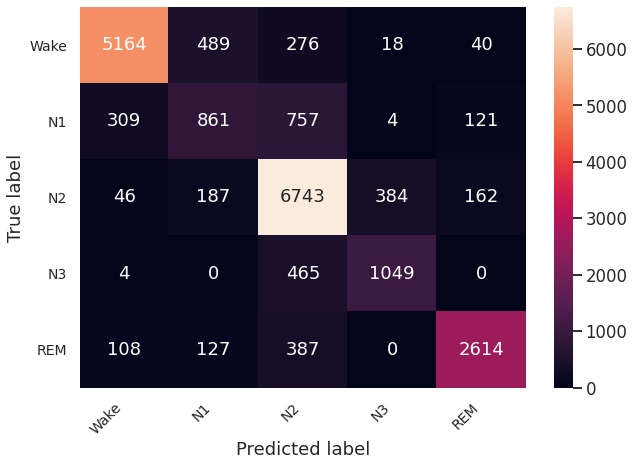

In [118]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
def print_confusion_matrix(confusion_matrix, class_names, figsize=(10, 7), fontsize=14):
    """Prints a confusion matrix, as returned by sklearn.metrics.confusion_matrix, as a heatmap.

    Arguments
    ---------
    confusion_matrix: numpy.ndarray
        The numpy.ndarray object returned from a call to sklearn.metrics.confusion_matrix.
        Similarly constructed ndarrays can also be used.
    class_names: list
        An ordered list of class names, in the order they index the given confusion matrix.
    figsize: tuple
        A 2-long tuple, the first value determining the horizontal size of the ouputted figure,
        the second determining the vertical size. Defaults to (10,7).
    fontsize: int
        Font size for axes labels. Defaults to 14.

    Returns
    -------
    matplotlib.figure.Figure
        The resulting confusion matrix figure
    """
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return fig

print("here1")
cm = confusion_matrix(gt, preds)
print_confusion_matrix(cm, class_names=['Wake', 'N1', 'N2', 'N3', 'REM'])
print("here2")

f1 = f1_score(gt, preds, average="macro")

acc = accuracy_score(gt, preds)

print("acc %s, f1 %s"%(acc, f1))

In [123]:
id = ['SC409', 'SC419', 'SC428', 'SC440', 'SC449', 'SC459', 'SC471', 'SC482']
test_ids = set(id)

test = [x for x in files if x.split("/")[-1][:5] in test_ids]

test_dict={}
for k in test:
    flag = True
    data = {}
    test_dict[k] = {}
    data = np.load(k)
    test_dict[k]["y"] = data["y"]
    test_dict[k]["x"] = data["x"]

In [139]:
from keras import optimizers, losses, activations, models
from keras.layers import Dense, Input, Dropout, Convolution1D, MaxPool1D, GlobalMaxPool1D, GlobalAveragePooling1D, \
    concatenate, SpatialDropout1D, TimeDistributed, Bidirectional, LSTM
from keras_contrib.layers import CRF

In [140]:
def get_base_model_psg():
    inp = Input(shape=(3000, 6))
    img_1 = Convolution1D(16, kernel_size=5, activation=activations.relu, padding="valid")(inp)
    img_1 = Convolution1D(16, kernel_size=5, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = SpatialDropout1D(rate=0.01)(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = SpatialDropout1D(rate=0.01)(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(32, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = MaxPool1D(pool_size=2)(img_1)
    img_1 = SpatialDropout1D(rate=0.01)(img_1)
    img_1 = Convolution1D(256, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = Convolution1D(256, kernel_size=3, activation=activations.relu, padding="valid")(img_1)
    img_1 = GlobalMaxPool1D()(img_1)
    img_1 = Dropout(rate=0.01)(img_1)

    dense_1 = Dropout(0.01)(Dense(64, activation=activations.relu, name="dense_1")(img_1))

    base_model = models.Model(inputs=inp, outputs=dense_1)
    opt = optimizers.Adam(0.001)

    base_model.compile(optimizer=opt, loss=losses.sparse_categorical_crossentropy, metrics=['acc'])
    #model.summary()
    return base_model

In [141]:
def get_model_cnn_crf_psg(lr=0.001):
    nclass = 5

    seq_input = Input(shape=(None, 3000, 6))
    base_model = get_base_model_psg()
    # for layer in base_model.layers:
    #     layer.trainable = False
    encoded_sequence = TimeDistributed(base_model)(seq_input)
    encoded_sequence = SpatialDropout1D(rate=0.01)(Convolution1D(128,
                                                               kernel_size=3,
                                                               activation="relu",
                                                               padding="same")(encoded_sequence))
    encoded_sequence = Dropout(rate=0.05)(Convolution1D(128,
                                                               kernel_size=3,
                                                               activation="linear",
                                                               padding="same")(encoded_sequence))

    # encoded_sequence = Bidirectional(LSTM(
    #
    # 0, return_sequences=True))(encoded_sequence)
    # encoded_sequence = Bidirectional(LSTM(100, return_sequences=True))(encoded_sequence)
    # encoded_sequence = Bidirectional(LSTM(100, return_sequences=False))(encoded_sequence)
    # out = TimeDistributed(Dense(nclass, activation="softmax"))(encoded_sequence)
    # out = Convolution1D(nclass, kernel_size=3, activation="linear", padding="same")(encoded_sequence)

    crf = CRF(nclass, sparse_target=True)

    out = crf(encoded_sequence)
    model = models.Model(seq_input, out)

    model.compile(optimizers.Adam(lr), crf.loss_function, metrics=[crf.accuracy])
    model.summary()

    return model

In [204]:
model2 = get_model_cnn_crf_psg(lr=0.0001)
file_path = "models/cnn_crf_model.ckpt"
model2.load_weights(file_path)

preds = []
gt = []

for record in tqdm(test_dict):
    all_rows = test_dict[record]['x']
    record_y_gt = []
    record_y_pred = []
    for batch_hyp in chunker(range(all_rows.shape[0])):


        X = all_rows[min(batch_hyp):max(batch_hyp)+1, ...]
        Y = test_dict[record]['y'][min(batch_hyp):max(batch_hyp)+1]

        X = np.expand_dims(X, 0)

        X = rescale_array(X)

        Y_pred = model2.predict(X)
        Y_pred = Y_pred.argmax(axis=-1).ravel().tolist()

        gt += Y.ravel().tolist()
        preds += Y_pred

        record_y_gt += Y.ravel().tolist()
        record_y_pred += Y_pred

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, None, 3000, 6)     0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, None, 64)          250816    
_________________________________________________________________
conv1d_28 (Conv1D)           (None, None, 128)         24704     
_________________________________________________________________
spatial_dropout1d_11 (Spatia (None, None, 128)         0         
_________________________________________________________________
conv1d_29 (Conv1D)           (None, None, 128)         49280     
_________________________________________________________________
dropout_9 (Dropout)          (None, None, 128)         0         
_________________________________________________________________
crf_2 (CRF)                  (None, None, 5)           680       
Total para

NameError: name 'test_dict' is not defined

here1
here2
acc 0.8163426039872016, f1 0.7467900700582177


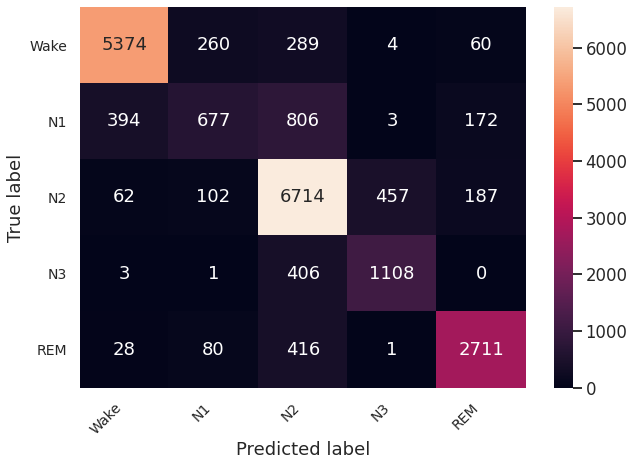

In [147]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
def print_confusion_matrix(confusion_matrix, class_names, figsize=(10, 7), fontsize=14):
    """Prints a confusion matrix, as returned by sklearn.metrics.confusion_matrix, as a heatmap.

    Arguments
    ---------
    confusion_matrix: numpy.ndarray
        The numpy.ndarray object returned from a call to sklearn.metrics.confusion_matrix.
        Similarly constructed ndarrays can also be used.
    class_names: list
        An ordered list of class names, in the order they index the given confusion matrix.
    figsize: tuple
        A 2-long tuple, the first value determining the horizontal size of the ouputted figure,
        the second determining the vertical size. Defaults to (10,7).
    fontsize: int
        Font size for axes labels. Defaults to 14.

    Returns
    -------
    matplotlib.figure.Figure
        The resulting confusion matrix figure
    """
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names,
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return fig

print("here1")
cm = confusion_matrix(gt, preds)
print_confusion_matrix(cm, class_names=['Wake', 'N1', 'N2', 'N3', 'REM'])
print("here2")

f1 = f1_score(gt, preds, average="macro")

acc = accuracy_score(gt, preds)

print("acc %s, f1 %s"%(acc, f1))

# K complex detection

In [20]:
train_dict

{'/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4071E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4351F0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4671G0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4172E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4622E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4322E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4652E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4751E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4722E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4642E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4412E0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4461F0.npz': {},
 '/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC456

In [11]:
temp = np.load('/home/fascia/Fascia_nucleus/Fascia_modelZoo/SleepEDF_NPZ/SC4071E0.npz')

In [77]:
temp = np.load('/home/fascia/Fascia_nucleus/Fascia_modelZoo/CNN_CNF_LSTM/test/SC4091E0.npy.npz')

In [205]:
tempy = np.load('/home/fascia/Fascia_nucleus/Fascia_modelZoo/CNN_CNF_LSTM/test/y/SC4091E0.npy.npz')

In [208]:
tempy['arr_0'].shape

(1132,)

In [78]:
temp['arr_0'].shape

(1132, 3000, 10)

In [79]:
indices = np.r_[0:10]

In [80]:
all_data = np.transpose(np.transpose(temp['arr_0'])[indices][:][:])

In [81]:
all_data.shape

(1132, 3000, 10)

In [84]:
single_epoch = all_data[603]

In [85]:
single_epoch.shape

(3000, 10)

In [23]:
single_epoch = np.reshape(single_epoch, single_epoch.size)

In [24]:
single_epoch.shape

(30000,)

In [35]:
sf=100

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
from mne.time_frequency import morlet

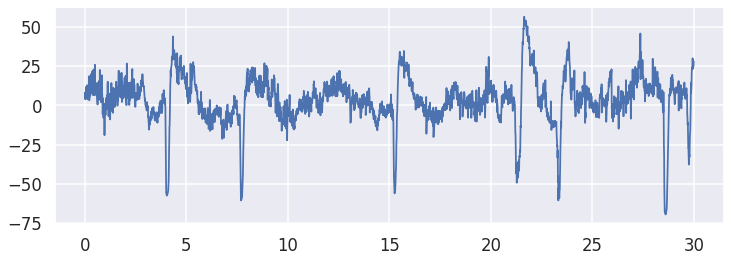

In [43]:
sns.set(context='talk')
fig, ax = plt.subplots(1, 1, figsize=(12, 4))
times = np.arange(single_epoch.size) / sf
ax.plot(times, single_epoch, lw=1.75)

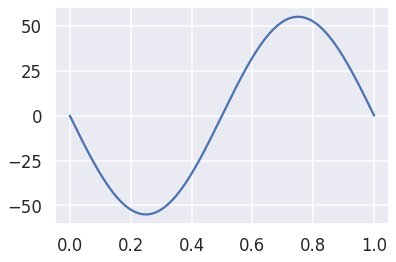

In [86]:
import numpy as np
import matplotlib.pyplot as plt

F = 1
T = 1
Fs = 5000
Ts = 1./Fs
N = int(T/Ts)

t = np.linspace(0, T, N)
signal = -55*np.sin(2*np.pi*F*t)

plt.plot(t, signal)
plt.show()

In [98]:
# Convolve the wavelet and extract magnitude and phase
analytic = np.convolve(single_epoch, signal, mode='same')
magnitude = np.abs(analytic)
phase = np.angle(analytic)

# Square and normalize the magnitude from 0 to 1 (using the min and max)
power = np.square(magnitude)
norm_power = (power - power.min()) / (power.max() - power.min())

# Define the threshold
thresh = 0.25

# Find supra-threshold values
supra_thresh = np.where(norm_power >= thresh)[0]



IndexError: index 3392 is out of bounds for axis 0 with size 3000

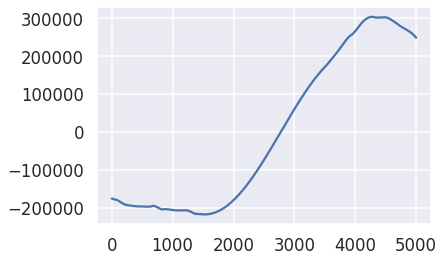

In [100]:
# plt.plot(analytic)

In [ ]:
# Create vector for plotting purposes
val_spindles = np.nan * np.zeros(single_epoch.size)
val_spindles[supra_thresh] = single_epoch[supra_thresh]

# Plot
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 7), sharex=True)
ax1.plot(times, single_epoch, lw=1.5)
ax1.plot(times, val_spindles, color='indianred', alpha=.8)
ax1.set_xlim(0, times[-1])
ax1.set_ylabel('Voltage [uV]')
ax1.set_title('Cz EEG signal')

ax2.plot(times, norm_power)
ax2.set_xlabel('Time [sec]')
ax2.set_ylabel('Normalized wavelet power')
ax2.axhline(thresh, ls='--', color='indianred', label='Threshold')
ax2.fill_between(times, norm_power, thresh, where = norm_power >= thresh,
                 color='indianred', alpha=.8)
plt.legend(loc='best')

In [111]:
# Parameters
cf = 13 \    # Central spindles frequency in Hz
nc = 12     # Number of oscillations in the spindles

# Compute the wavelet
wlt = morlet(sf, [cf], n_cycles=nc)[0]

 # Plot
t = np.arange(wlt.size) / sf
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
ax.plot(t, wlt)
plt.ylim(-0.4, 0.4)
plt.xlim(t[0], t[-1])
plt.xlabel('Time [seconds]')
plt.ylabel('Amplitude [a.u.]')

AttributeError: 'numpy.ndarray' object has no attribute 'append'

In [102]:
x = single_epoch

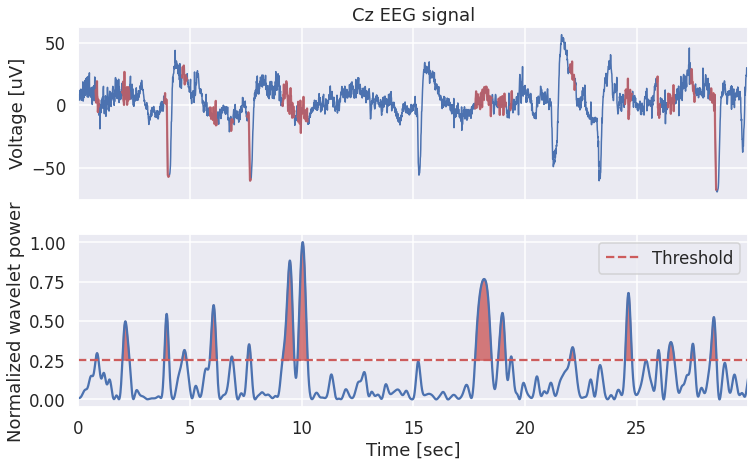

In [103]:
# Convolve the wavelet and extract magnitude and phase
analytic = np.convolve(x, wlt, mode='same')
magnitude = np.abs(analytic)
phase = np.angle(analytic)

# Square and normalize the magnitude from 0 to 1 (using the min and max)
power = np.square(magnitude)
norm_power = (power - power.min()) / (power.max() - power.min())

# Define the threshold
thresh = 0.25

# Find supra-threshold values
supra_thresh = np.where(norm_power >= thresh)[0]

# Create vector for plotting purposes
val_spindles = np.nan * np.zeros(x.size)
val_spindles[supra_thresh] = x[supra_thresh]

# Plot
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 7), sharex=True)
ax1.plot(times, x, lw=1.5)
ax1.plot(times, val_spindles, color='indianred', alpha=.8)
ax1.set_xlim(0, times[-1])
ax1.set_ylabel('Voltage [uV]')
ax1.set_title('Cz EEG signal')

ax2.plot(times, norm_power)
ax2.set_xlabel('Time [sec]')
ax2.set_ylabel('Normalized wavelet power')
ax2.axhline(thresh, ls='--', color='indianred', label='Threshold')
ax2.fill_between(times, norm_power, thresh, where = norm_power >= thresh,
                 color='indianred', alpha=.8)
plt.legend(loc='best')

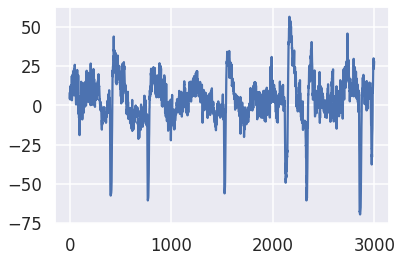

In [105]:
plt.plot(single_epoch)

/home/fascia/.local/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


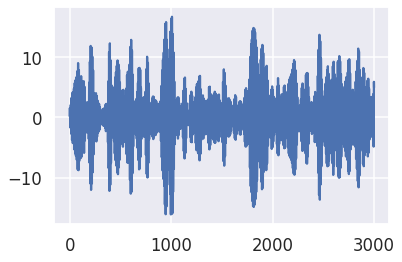

In [106]:
plt.plot(analytic)

# Spectogram

In [150]:
def get_xn(Xs,n):
    '''
    calculate the Fourier coefficient X_n of 
    Discrete Fourier Transform (DFT)
    '''
    L  = len(Xs)
    ks = np.arange(0,L,1)
    xn = np.sum(Xs*np.exp((1j*2*np.pi*ks*n)/L))/L
    return(xn)

def get_xns(ts):
    '''
    Compute Fourier coefficients only up to the Nyquest Limit Xn, n=1,...,L/2
    and multiply the absolute value of the Fourier coefficients by 2, 
    to account for the symetry of the Fourier coefficients above the Nyquest Limit. 
    '''
    mag = []
    L = len(ts)
    for n in range(int(L/2)): # Nyquest Limit
        mag.append(np.abs(get_xn(ts,n))*2)
    return(mag)
mag = get_xns(single_epoch)

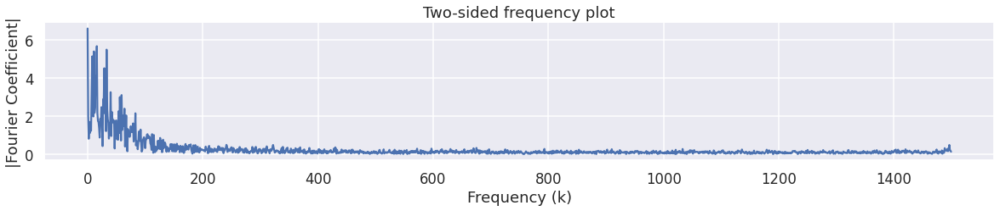

In [151]:
# the number of points to label along xaxis
Nxlim = 10

plt.figure(figsize=(20,3))
plt.plot(mag)
plt.xlabel("Frequency (k)")
plt.title("Two-sided frequency plot")
plt.ylabel("|Fourier Coefficient|")
plt.show()

In [152]:
def plot_spectrogram(spec,ks,sample_rate, L, starts, mappable = None):
    plt.figure(figsize=(20,8))
    plt_spec = plt.imshow(spec,origin='lower')

    ## create ylim
    Nyticks = 10
    ks      = np.linspace(0,spec.shape[0],Nyticks)
    ksHz    = get_Hz_scale_vec(ks,sample_rate,len(ts))
    plt.yticks(ks,ksHz)
    plt.ylabel("Frequency (Hz)")

    ## create xlim
    Nxticks = 10
    ts_spec = np.linspace(0,spec.shape[1],Nxticks)
    ts_spec_sec  = ["{:4.2f}".format(i) for i in np.linspace(0,total_ts_sec*starts[-1]/len(ts),Nxticks)]
    plt.xticks(ts_spec,ts_spec_sec)
    plt.xlabel("Time (sec)")

    plt.title("Spectrogram L={} Spectrogram.shape={}".format(L,spec.shape))
    plt.colorbar(mappable,use_gridspec=True)
    plt.show()
    return(plt_spec)

(array([[5.90035082e+01, 6.51246098e+01, 1.04626523e+01, ...,
         1.02598179e+01, 1.63458544e+02, 2.04418057e+01],
        [1.01234065e+01, 9.59410720e+01, 1.74776043e+02, ...,
         1.06133407e+01, 1.85403882e+02, 2.98887775e+02],
        [2.55530435e+01, 1.17497194e+01, 1.56645332e+02, ...,
         1.41778171e+01, 5.43543599e+01, 2.24525016e+02],
        ...,
        [3.63773574e-01, 6.41611371e-01, 6.12868772e-02, ...,
         7.08178108e-01, 5.00565319e-01, 4.69899978e-01],
        [9.19800769e-01, 1.05529742e+00, 3.93064727e-01, ...,
         1.60642824e+00, 2.94421417e-01, 5.02663879e-01],
        [1.84114245e-01, 3.26633381e-01, 2.63893684e-01, ...,
         1.76308213e-01, 1.18348810e+00, 7.18036915e-01]]),
 array([ 0.      ,  0.390625,  0.78125 ,  1.171875,  1.5625  ,  1.953125,
         2.34375 ,  2.734375,  3.125   ,  3.515625,  3.90625 ,  4.296875,
         4.6875  ,  5.078125,  5.46875 ,  5.859375,  6.25    ,  6.640625,
         7.03125 ,  7.421875,  7.8125  ,  8

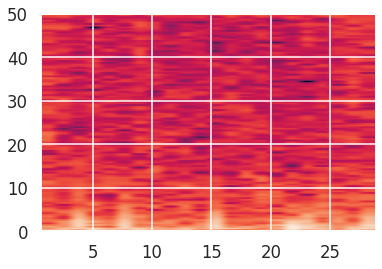

In [153]:
plt.specgram(single_epoch,Fs=100)

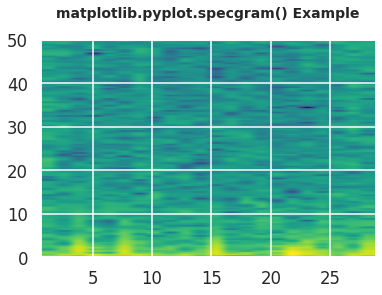

In [159]:
import matplotlib.pyplot as plt  
import numpy as np

plt.specgram(single_epoch, Fs = 100, cmap='viridis') 
plt.title('matplotlib.pyplot.specgram() Example\n',  
          fontsize = 14, fontweight ='bold') 
  
plt.show() 

In [161]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        (None, None, 3000, 6)     0         
_________________________________________________________________
time_distributed_12 (TimeDis (None, None, 64)          250816    
_________________________________________________________________
conv1d_107 (Conv1D)          (None, None, 128)         24704     
_________________________________________________________________
spatial_dropout1d_42 (Spatia (None, None, 128)         0         
_________________________________________________________________
conv1d_108 (Conv1D)          (None, None, 128)         49280     
_________________________________________________________________
dropout_30 (Dropout)         (None, None, 128)         0         
_________________________________________________________________
crf_6 (CRF)                  (None, None, 5)           680       
Total para

In [168]:
for layer in model.layers:
	# check for convolutional layer
	if 'time' not in layer.name:
		continue
	# get filter weights
	filters, biases = layer.get_weights()[0]
	print(layer.name, filters.shape)

ValueError: too many values to unpack (expected 2)

In [183]:
len(model.layers[1].get_weights())

18

In [241]:
filters = model.layers[1].get_weights()[17]

In [242]:
filters.shape

(64,)

In [231]:
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

In [232]:
# plt.plot(filters[0, :, :])

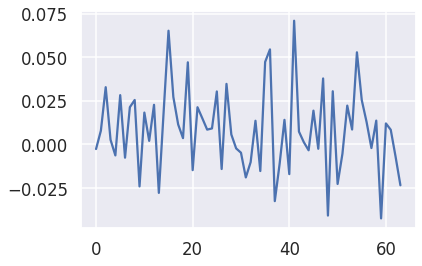

In [243]:
plt.plot(filters[:])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=64).
  """Entry point for launching an IPython kernel.


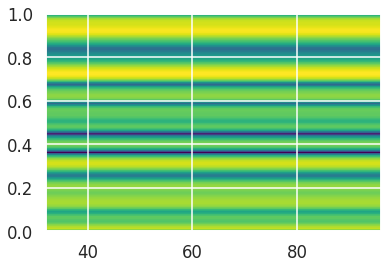

In [256]:
plt.specgram(filters, cmap='viridis') 
plt.show() 

In [250]:
import keras.backend as K

In [ ]:
import Keras

In [269]:
import scipy

In [267]:
!conda install scipy==1.1.0

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: / 
Found conflicts! Looking for incompatible packages.
This can take several minutes.  Press CTRL-C to abort.
                                                                               failed

UnsatisfiableError: The following specifications were found
to be incompatible with the existing python installation in your environment:

Specifications:

  - scipy==1.1.0 -> python[version='>=2.7,<2.8.0a0|>=3.6,<3.7.0a0|>=3.7,<3.8.0a0|>=3.5,<3.6.0a0']

Your python: python=3.8

If python is on the left-most side of the chain, that's the version you've asked for.
When python appears to the right, that indicates that the thing on the left is somehow
not available for the python version you are constrained to. Note that conda will not
change your python version to a different minor version unless you explic

In [288]:
from vis.visualization import visualize_saliency, overlay
for modifier in ['guided', 'relu']:
    for i, img in enumerate([single_epoch, single_epoch]):    
        # 20 is the imagenet index corresponding to `ouzel`
        grads = visualize_saliency(model, -1, filter_indices=20, 
                                   seed_input=img, backprop_modifier=modifier)
        # Lets overlay the heatmap onto original image.    
        plt.plot(grads)

ValueError: Unknown layer: CRF

In [8]:
model_lstm = get_model_lstm()
file_path = "models/lstm.ckpt"
model_lstm.load_weights(file_path)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, 3000, 10)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, None, 64)          251136    
_________________________________________________________________
bidirectional_1 (Bidirection (None, None, 200)         132000    
_________________________________________________________________
dropout_3 (Dropout)          (None, None, 200)         0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, None, 200)         240800    
_________________________________________________________________
conv1d_9 (Conv1D)    

In [20]:
from vis.visualization import visualize_saliency, overlay
for modifier in ['guided', 'relu']:
    for i, img in enumerate([single_epoch, single_epoch]):    
        # 20 is the imagenet index corresponding to `ouzel`
        grads = visualize_saliency(model_lstm, -1, filter_indices=20, 
                                   seed_input=img, backprop_modifier=modifier)
        # Lets overlay the heatmap onto original image.    
        plt.plot(grads)

ValueError: slice index 20 of dimension 2 out of bounds. for 'strided_slice' (op: 'StridedSlice') with input shapes: [?,?,5], [3], [3], [3] and with computed input tensors: input[1] = <0 0 20>, input[2] = <0 0 21>, input[3] = <1 1 1>.

In [60]:
import keras.backend as K

In [81]:
def get_class_activation_map(model, signal, target_class=2) :   
    signal = np.expand_dims(signal, 0)
    signal = np.expand_dims(signal, 0)
    signal = rescale_array(signal)
    predict = model.predict(signal)
    predicted_class = np.argmax(predict[0])
    print("Predicted : ", predicted_class)
    # change the layer here if required, this is the last conv layer
    last_conv = model.get_layer('time_distributed_1')
    grads =K.gradients(model.output[:,target_class],last_conv.output)[0]
    
    print(grads.shape)
    pooled_grads = K.mean(grads,axis=(0,1))
    iterate = K.function([model.input],[pooled_grads,last_conv.output[0]])
    pooled_grads_value,conv_layer_output = iterate([signal])
    
#     for i in range(512):
#         conv_layer_output[:,:,i] *= pooled_grads_value[i]
    
#     heatmap = np.mean(conv_layer_output,axis=-1)
    
#     for x in range(heatmap.shape[0]):
#         for y in range(heatmap.shape[1]):
#             heatmap[x,y] = np.max(heatmap[x,y],0)
#     heatmap = np.maximum(heatmap,0)
#     if np.max(heatmap)>0:
#         heatmap /= np.max(heatmap)
#     heatmap[heatmap<0.8] = 0
#     upsample = cv2.resize(heatmap, (224,224))
#     upsample[upsample<0.3] = 0
#     im = im*imagenet_std+imagenet_mean
#     plt.subplot(1,2,1)
#     plt.imshow(im[:, :, 0], cmap='gray')
#     plt.subplot(1,2,2)
#     plt.imshow((im[:, :, 0]/255.0), cmap='gray')
#     plt.imshow(upsample, alpha=0.4)
#     plt.show()
#     print("---------------------")

In [82]:
grads

NameError: name 'grads' is not defined

In [83]:
get_class_activation_map(model_lstm, single_epoch)

Predicted :  2
(?, ?, 64)


InvalidArgumentError: slice index 2 of dimension 1 out of bounds.
	 [[{{node strided_slice_10}}]]
	 [[{{node Mean_5}}]]

In [71]:
grads

NameError: name 'grads' is not defined

In [86]:
W_conv= model_lstm.layers[0].get_weights()

In [87]:
plot_filters(W_conv, 4, figsize=(20,8))

NameError: name 'plot_filters' is not defined

In [88]:
model_lstm.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, 3000, 10)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, None, 64)          251136    
_________________________________________________________________
bidirectional_1 (Bidirection (None, None, 200)         132000    
_________________________________________________________________
dropout_3 (Dropout)          (None, None, 200)         0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, None, 200)         240800    
_________________________________________________________________
conv1d_9 (Conv1D)            (None, None, 5)           1005      
Total params: 624,941
Trainable params: 373,805
Non-trainable params: 251,136
________________________________________________________________

In [90]:
W_conv, b_conv = model_lstm.layers[-1].get_weights()

In [99]:
W_conv[0][:, 0].shape

(200,)

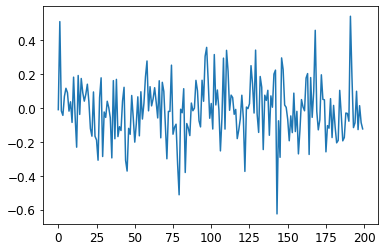

In [108]:
plt.plot(W_conv[0][:, 4])

In [129]:
model_lstm.layers[1].output.shape

TensorShape([Dimension(None), Dimension(None), Dimension(64)])

In [142]:
import tensorflow.keras.backend as K

def compute_salient_bases(model, x):
#   input_tensors = [model.input]
#   gradients = model.optimizer.get_gradients(model.layers[1].output[0][0], model.input)
#   compute_gradients = K.function(inputs = input_tensors, outputs = gradients)
  
#   x_value = np.expand_dims(x, axis=0)
#   gradients = compute_gradients([x_value])[0][0]
    last_conv = model.get_layer('time_distributed_1')
    gradients =K.gradients(model.output[:,2],last_conv.output)[0]
    print(gradients.shape)
    sal = np.sum(np.multiply(gradients,x), axis=1)
    return sal

In [144]:
# sequence_index = 1999  # You can change this to compute the gradient for a different example. But if so, change the coloring below as well.
sal = compute_salient_bases(model_lstm, single_epoch)

# plt.figure(figsize=[16,5])
# barlist = plt.bar(np.arange(len(sal)), sal)
# [barlist[i].set_color('C1') for i in range(5,17)]  # Change the coloring here if you change the sequence index.
# plt.xlabel('Bases')
# plt.ylabel('Magnitude of saliency values')
# plt.xticks(np.arange(len(sal)), list(sequences[sequence_index]));
# plt.title('Saliency map for bases in one of the positive sequences'
#           ' (green indicates the actual bases in motif)');

(?, ?, 64)


In [145]:
sal.shape

(3000,)

In [146]:
sal[]

array([<tf.Tensor 'add_132002:0' shape=(?, ?, 64) dtype=float32>,
       <tf.Tensor 'add_132003:0' shape=(?, ?, 64) dtype=float32>,
       <tf.Tensor 'add_132004:0' shape=(?, ?, 64) dtype=float32>, ...,
       <tf.Tensor 'add_134999:0' shape=(?, ?, 64) dtype=float32>,
       <tf.Tensor 'add_135000:0' shape=(?, ?, 64) dtype=float32>,
       <tf.Tensor 'add_135001:0' shape=(?, ?, 64) dtype=float32>],
      dtype=object)

In [147]:
!pip install keract

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [148]:
import keract

In [150]:
model_lstm.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, 3000, 10)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, None, 64)          251136    
_________________________________________________________________
bidirectional_1 (Bidirection (None, None, 200)         132000    
_________________________________________________________________
dropout_3 (Dropout)          (None, None, 200)         0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, None, 200)         240800    
_________________________________________________________________
conv1d_9 (Conv1D)            (None, None, 5)           1005      
Total params: 624,941
Trainable params: 373,805
Non-trainable params: 251,136
________________________________________________________________

In [96]:
from keras import models

In [97]:
layer_outputs = [layer.output for layer in model_lstm.layers[:6]][1:]
# Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=model_lstm.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

In [98]:
signal = np.expand_dims(single_epoch, 0)
signal = np.expand_dims(signal, 0)
signal = rescale_array(signal)

In [99]:
signal.shape

(1, 1, 3000, 10)

In [268]:
activations = activation_model.predict(signal) 
# Returns a list of five Numpy arrays: one array per layer activation

In [269]:
len(activations)

5

In [270]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 1, 64)


In [271]:
first_layer_activation[0, 0, :].shape

(64,)

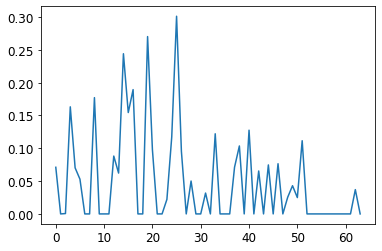

In [272]:
plt.plot(first_layer_activation[0, 0, :])

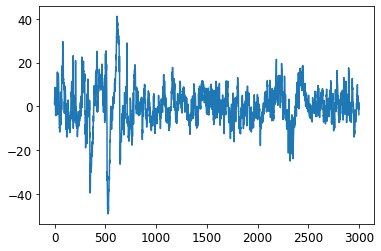

In [273]:
plt.plot(single_epoch[:, 0])

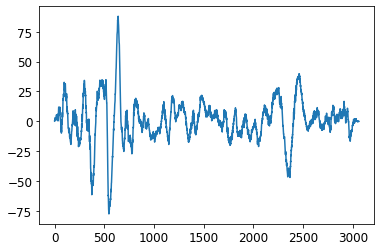

In [274]:
plt.plot(np.convolve(first_layer_activation[0, 0, :], single_epoch[:, 0]))

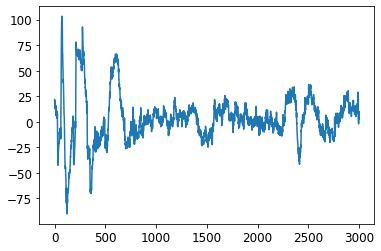

In [107]:
plt.plot(single_epoch[:, 2])

In [280]:
second_layer_activation = activations[1]
print(second_layer_activation.shape)

(1, 1, 200)


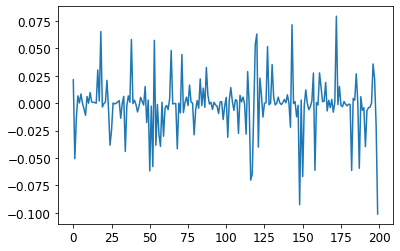

In [281]:
plt.plot(second_layer_activation[0, 0, :])

In [110]:
first_layer_output = np.convolve(first_layer_activation[0, 0, :], single_epoch[:, 0])

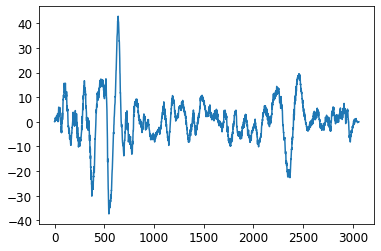

In [111]:
plt.plot(first_layer_output)

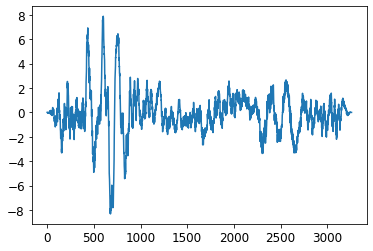

In [277]:
plt.plot(np.convolve(second_layer_activation[0, 0, :], first_layer_output))

In [113]:
second_layer_output = np.convolve(second_layer_activation[0, 0, :], first_layer_output)

In [278]:
third_layer_activation = activations[2]
print(third_layer_activation.shape)

(1, 1, 200)


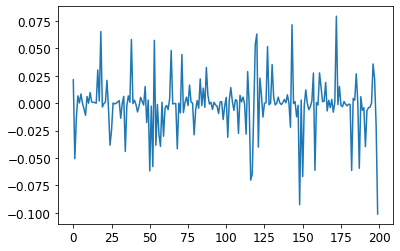

In [282]:
plt.plot(third_layer_activation[0, 0, :])

In [283]:
third_layer_output = np.convolve(third_layer_activation[0, 0, :], second_layer_output)

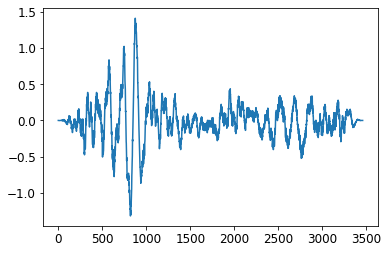

In [284]:
plt.plot(third_layer_output)

In [285]:
fourth_layer_activation = activations[3]
print(fourth_layer_activation.shape)

(1, 1, 200)


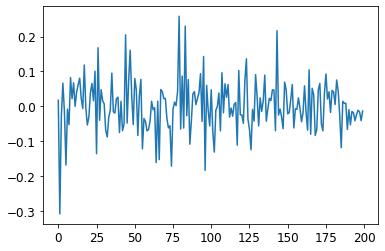

In [286]:
plt.plot(fourth_layer_activation[0, 0, :])

In [287]:
fourth_layer_output = np.convolve(fourth_layer_activation[0, 0, :], second_layer_output)

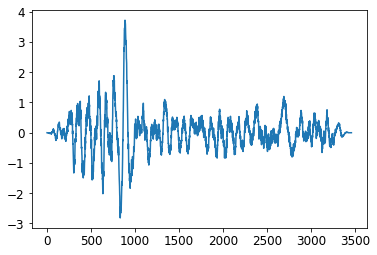

In [288]:
plt.plot(fourth_layer_output)

In [289]:
fifth_layer_activation = activations[4]
print(fifth_layer_activation.shape)

(1, 1, 5)


In [290]:
fifth_layer_activation

array([[[0.45565432, 0.05643746, 0.19056751, 0.25015804, 0.04718269]]],
      dtype=float32)

In [222]:
model_lstm.predict(signal)

array([[[0.2398066 , 0.09937362, 0.41364536, 0.13420384, 0.11297058]]],
      dtype=float32)

In [223]:
layers_info = {}
for i in model_lstm.layers:
    layers_info[i.name] = i.get_config()

In [224]:
layers_info.keys()

dict_keys(['input_1', 'time_distributed_1', 'bidirectional_1', 'dropout_3', 'bidirectional_2', 'conv1d_9'])

In [225]:
layers_info['time_distributed_1']

{'name': 'time_distributed_1',
 'trainable': True,
 'layer': {'class_name': 'Model',
  'config': {'name': 'model_1',
   'layers': [{'name': 'input_2',
     'class_name': 'InputLayer',
     'config': {'batch_input_shape': (None, 3000, 10),
      'dtype': 'float32',
      'sparse': False,
      'name': 'input_2'},
     'inbound_nodes': []},
    {'name': 'conv1d_1',
     'class_name': 'Conv1D',
     'config': {'name': 'conv1d_1',
      'trainable': False,
      'filters': 16,
      'kernel_size': (5,),
      'strides': (1,),
      'padding': 'valid',
      'data_format': 'channels_last',
      'dilation_rate': (1,),
      'activation': 'relu',
      'use_bias': True,
      'kernel_initializer': {'class_name': 'VarianceScaling',
       'config': {'scale': 1.0,
        'mode': 'fan_avg',
        'distribution': 'uniform',
        'seed': None}},
      'bias_initializer': {'class_name': 'Zeros', 'config': {}},
      'kernel_regularizer': None,
      'bias_regularizer': None,
      'activity_

In [228]:
#importing the required modules
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations
from keras import applications
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18,6)
# #creating a VGG16 model using fully connected layers also because then we can 
# #visualize the patterns for individual category
# from keras.applications import VGG16
# model = VGG16(weights='imagenet',include_top=True)

#finding out the layer index using layer name
#the find_layer_idx function accepts the model and name of layer as parameters and return the index of respective layer
layer_idx = utils.find_layer_idx(model_lstm,'conv1d_9')
#changing the activation of the layer to linear
model_lstm.layers[layer_idx].activation = activations.linear
#applying modifications to the model
model_lstm_ = utils.apply_modifications(model_lstm)
#Indian elephant
img3 = visualize_activation(model_lstm_,layer_idx, verbose=True)
plt.imshow(img3)

TypeError: unsupported operand type(s) for *: 'int' and 'NoneType'

In [4]:
from vis import visualization, utils
from keras import activations

In [88]:
grads = visualization.visualize_saliency(model_lstm, -2, filter_indices=None, seed_input=signal, backprop_modifier='guided')




In [89]:
grads.shape

(1, 3000)

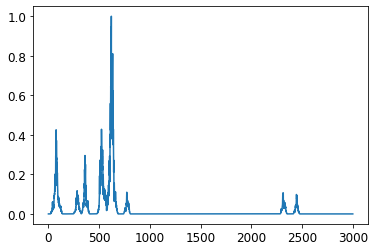

In [90]:
plt.plot(grads[0, :])

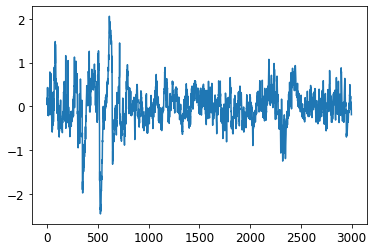

In [91]:
plt.plot(signal[0, 0, :, 0])

In [92]:
sf = 100
times = np.arange(3000) / sf

In [93]:
mask = np.zeros(3000)
for i in range(3000):
    if(grads[0, i]>=0.1):
        mask[i]=signal[0, 0, :, 0][i]
    else:
        mask[i]=np.nan

Text(0.5, 1.0, 'Cz EEG signal')

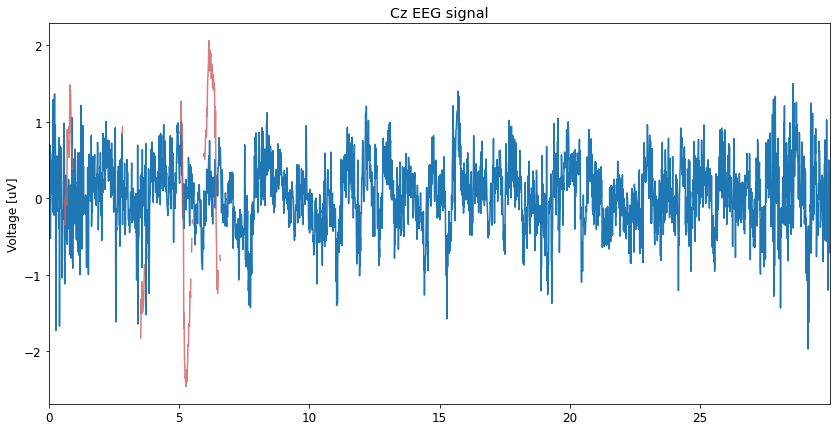

In [291]:
fig, ax1 = plt.subplots(1, 1, figsize=(14, 7), sharex=True)
ax1.plot(times, signal[0, 0, :, 1], lw=1.5)
ax1.plot(times, mask, color='indianred', alpha=.8)
ax1.set_xlim(0, times[-1])
ax1.set_ylabel('Voltage [uV]')
ax1.set_title('Cz EEG signal')

In [75]:
single_epoch = all_data[2]

In [76]:
single_epoch.size

30000

In [123]:
layer_names = [layer.name for layer in model_lstm.layers]
layer_names

['input_1',
 'time_distributed_1',
 'bidirectional_1',
 'dropout_3',
 'bidirectional_2',
 'conv1d_9']

In [130]:
layer_outputs = [layer.output for layer in model_lstm.layers[1:]]

In [131]:
feature_map_model = models.Model(input = model_lstm.input, output=layer_outputs)

In [132]:
feature_maps = feature_map_model.predict(signal)

In [133]:
for layer_name, feature_map in zip(layer_names, feature_maps):print(f"The shape of the {layer_name} is =======>> {feature_map.shape}")
    

The shape of the input_1 is =======>> (1, 1, 64)
The shape of the time_distributed_1 is =======>> (1, 1, 200)
The shape of the bidirectional_1 is =======>> (1, 1, 200)
The shape of the dropout_3 is =======>> (1, 1, 200)
The shape of the bidirectional_2 is =======>> (1, 1, 5)


In [136]:
import keras.backend as K

In [137]:
lstm = model_lstm.layers[2]

# Get output from intermediate layer to visualize activations
attn_func = K.function(inputs = [model_lstm.get_input_at(0), K.learning_phase()],
           outputs = [lstm.output])

In [138]:
# get html element
def cstr(s, color='black'):
	if s == ' ':
		return "<text style=color:#000;padding-left:10px;background-color:{}> </text>".format(color, s)
	else:
		return "<text style=color:#000;background-color:{}>{} </text>".format(color, s)
	
# print html
def print_color(t):
	display(html_print(''.join([cstr(ti, color=ci) for ti,ci in t])))

# get appropriate color for value
def get_clr(value):
	colors = ['#85c2e1', '#89c4e2', '#95cae5', '#99cce6', '#a1d0e8'
		'#b2d9ec', '#baddee', '#c2e1f0', '#eff7fb', '#f9e8e8',
		'#f9e8e8', '#f9d4d4', '#f9bdbd', '#f8a8a8', '#f68f8f',
		'#f47676', '#f45f5f', '#f34343', '#f33b3b', '#f42e2e']
	value = int((value * 100) / 5)
	return colors[value]

# sigmoid function
def sigmoid(x):
	z = 1/(1 + np.exp(-x)) 
	return z

In [155]:
output_values

NameError: name 'output_values' is not defined

In [156]:
output_values, result_list = get_predictions(signal)

# for cell_no in [189, 435, 463]:
# 	visualize(output_values, result_list, cell_no)

ValueError: low >= high

In [158]:
output.shape

(1, 200)

In [159]:
result_list = []
for i in range(200):
    result_list.append(i+1)

In [160]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, CuDNNLSTM
from keras.callbacks import ModelCheckpoint
from keras.utils import np_utils
import re

# Imports for visualisations
from IPython.display import HTML as html_print
from IPython.display import display
import keras.backend as K

In [225]:
visualize(output[0, :], result_list, 0)

TypeError: only integer scalar arrays can be converted to a scalar index

In [181]:
import yasa

In [184]:
# yasa.plot_spectrogram(data[0, :], 100, hypno);

In [192]:
all_data.shape

(1132, 3000, 10)

In [226]:
cell = 0

In [241]:
output_values = []
for ind in range(len(all_data)):
    epoch = all_data[ind]
    
    signal = np.expand_dims(epoch, 0)
    signal = np.expand_dims(signal, 0)
    signal = rescale_array(signal)
    
    prediction = model_lstm.predict(signal, verbose=0)

    # LSTM Activations
    output = attn_func([signal])[0][0]
    output = sigmoid(output)
    
    output_values.append(output)

In [254]:
print(output_values[0][0][10])

0.50070864


In [245]:
cell = 0

In [258]:
def visualize(ran, output_value, actual, cell):
    text_colours = []
    
    for i in range(ran):
        text = (actual[i], get_clr(output_value[i][0][cell]))
        text_colours.append(text)
    print_color(text_colours)

# Get Predictions from random sequence
def get_predictions(data):
	start = np.random.randint(0, len(data)-1)
	pattern = data[start]
	result_list, output_values = [], []
	print("Seed:")
	print("\"" + ''.join([int_to_char[value] for value in pattern]) + "\"")
	print("\nGenerated:")

	for i in range(1000):
		# Reshaping input array for predicting next character
		x = np.reshape(pattern, (1, len(pattern), 1))
		x = x / float(n_vocab)

		# Prediction
		prediction = model.predict(x, verbose=0)

		# LSTM Activations
		output = attn_func([x])[0][0]
		output = sigmoid(output)
		output_values.append(output)

		# Predicted Character
		index = np.argmax(prediction)
		result = int_to_char[index]

		# Preparing input for next character
		seq_in = [int_to_char[value] for value in pattern]
		pattern.append(index)
		pattern = pattern[1:len(pattern)]

		# Saving generated characters
		result_list.append(result)
	return output_values, result_list

In [265]:
output_values

[array([[0.5042259 , 0.4999848 , 0.49731004, 0.502401  , 0.5007334 ,
         0.5040818 , 0.50046563, 0.49966738, 0.49853244, 0.4998092 ,
         0.50070864, 0.50103015, 0.4999324 , 0.50035876, 0.5006044 ,
         0.49980754, 0.50405794, 0.5007439 , 0.504183  , 0.49881086,
         0.500366  , 0.50116736, 0.5023159 , 0.49949422, 0.49575928,
         0.49882713, 0.49971145, 0.500602  , 0.5003583 , 0.50092036,
         0.49957275, 0.49770412, 0.49975204, 0.50078857, 0.49496013,
         0.4989005 , 0.5012179 , 0.50013375, 0.504671  , 0.49905705,
         0.5002736 , 0.49919134, 0.49906644, 0.4993929 , 0.5013975 ,
         0.4996106 , 0.5004676 , 0.4996327 , 0.49766102, 0.49775687,
         0.49836266, 0.50175136, 0.49829376, 0.504988  , 0.49720135,
         0.5002353 , 0.49660736, 0.49807304, 0.5002821 , 0.498957  ,
         0.49776545, 0.49988732, 0.49882954, 0.50149554, 0.5036719 ,
         0.49957722, 0.49939236, 0.49935508, 0.4954228 , 0.49993187,
         0.49837682, 0.50473493, 0

In [259]:
visualize(len(output_values), output_values, tempy['arr_0'], cell = 0)

In [260]:
visualize(len(output_values), output_values, tempy['arr_0'], cell = 1)

In [261]:
visualize(len(output_values), output_values, tempy['arr_0'], cell = 2)

In [294]:
for i in range(200):
    visualize(len(output_values), output_values, tempy['arr_0'], cell = i)